In [1]:
from gluonts.dataset.repository import get_dataset

import matplotlib.pyplot as plt

import os
import pickle

In [2]:
NORMALIZER_NAME = 'gas_t_student'
DL_MODEL_LIBRARY = "gluonts"
DATASET_NAME = "nn5_weekly"
DATASET_TYPE = "gluonts"    # gluonts or synthetic

multivariate = "_multivariate"   # "_multivariate" if its multivariate, empty otherwise

ROOT_FOLDER = f"../RESULTS_{DATASET_NAME}_{NORMALIZER_NAME}_{DL_MODEL_LIBRARY}" + multivariate

Get results

In [3]:
normalizer_folder = os.path.join(ROOT_FOLDER, NORMALIZER_NAME)
init_params_norm_filename = os.path.join(normalizer_folder, 'init_params.json')
###
means_folder = os.path.join(normalizer_folder, 'means')
test_means_folder = os.path.join(means_folder, 'test')
vars_folder = os.path.join(normalizer_folder, 'vars')
test_vars_folder = os.path.join(vars_folder, 'test')
norm_ts_folder = os.path.join(normalizer_folder, 'normalized_ts')
test_norm_ts_folder = os.path.join(norm_ts_folder, 'test')
params_folder = os.path.join(normalizer_folder, 'normalizer_params')
test_params_folder = os.path.join(params_folder, 'test')

test_means = []
for i in range(len(os.listdir(test_means_folder))):
    with open(os.path.join(test_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_means.append(pickle.load(f))
test_vars = []
for i in range(len(os.listdir(test_vars_folder))):
    with open(os.path.join(test_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_vars.append(pickle.load(f))
test_params = []
for i in range(len(os.listdir(test_params_folder))):
    with open(os.path.join(test_params_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_params.append(pickle.load(f))
test_norm_ts = []
for i in range(len(os.listdir(test_norm_ts_folder))):
    with open(os.path.join(test_norm_ts_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_norm_ts.append(pickle.load(f))

In [4]:
mean_layer_name = 'linear'
mean_layer_folder = os.path.join(ROOT_FOLDER, mean_layer_name)
init_params_mean_layer_filename = os.path.join(mean_layer_folder, 'init_params.json')
mean_layer_filename = os.path.join(mean_layer_folder, 'mean_layer.pkl')
mean_layer_res_filename = os.path.join(mean_layer_folder, 'results.txt')
test_means_predictions_folder = os.path.join(mean_layer_folder, 'test_mean_layer_preds')

predictions = []
for i in range(len(os.listdir(test_means_predictions_folder))):
    with open(os.path.join(test_means_predictions_folder, f'ts_{i}.pkl'), 'rb') as f:
        predictions.append(pickle.load(f))

len(predictions), type(predictions[0]), predictions[0].shape

(111, numpy.ndarray, (113, 1))

In the multivariate case we have a list with a single multivariate time series of shape (n_features, length). 

In the univariate case, we have a list of n_time_series (or features) 1D time series.

In [5]:
if multivariate == "":
    # univariate case
    n_features = len(predictions)
else:
    predictions = predictions[0]
    test_norm_ts = test_norm_ts[0]
    test_means = test_means[0]
    test_vars = test_vars[0]
    n_features = predictions.shape[1]

n_features

111

Get dataset

In [6]:
if DATASET_TYPE == "synthetic":
    test_dataset_filename = os.path.join(ROOT_FOLDER, "test_dataset.pkl")
    with open(test_dataset_filename, "rb") as f:
        dataset = pickle.load(f)
else:
    dataset = get_dataset(DATASET_NAME)
    dataset = [el for el in dataset.test]

test_dataset = [el["target"] for el in dataset]

len(test_dataset), type(test_dataset[0])

(111, numpy.ndarray)

Plot stuff

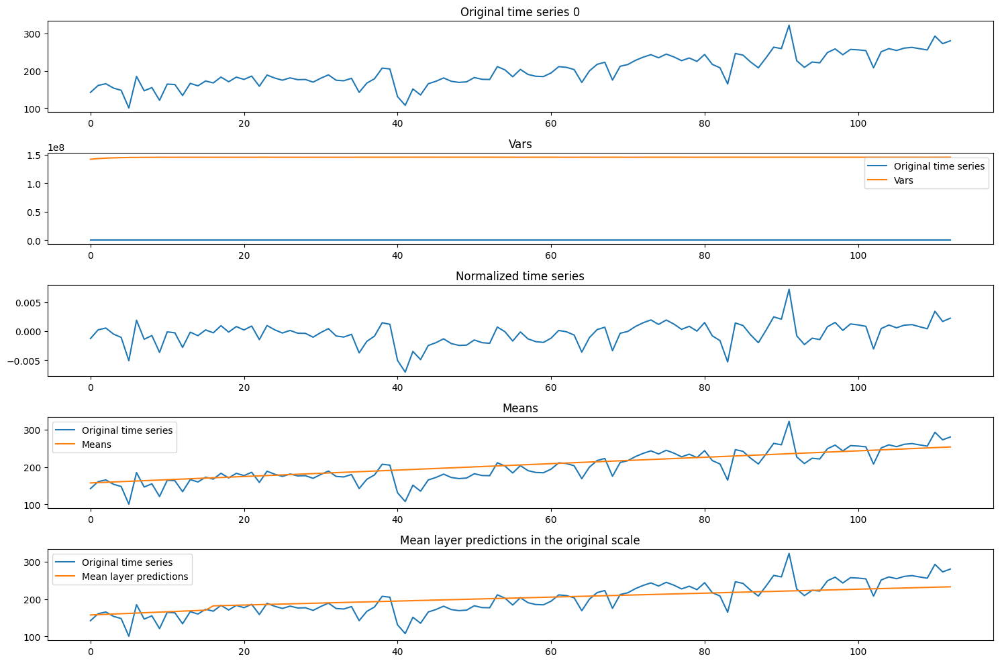

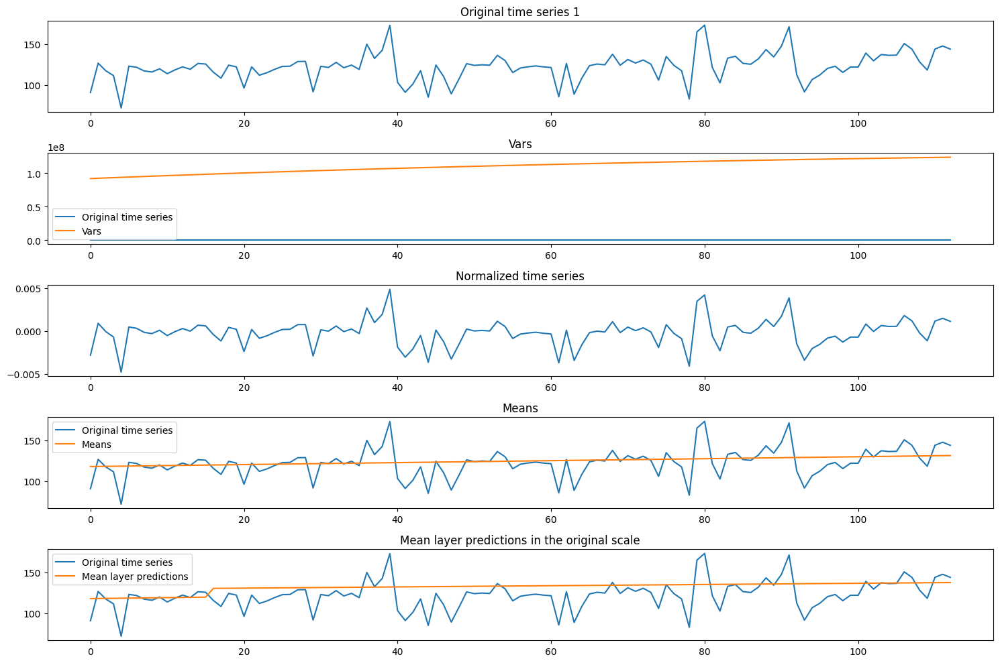

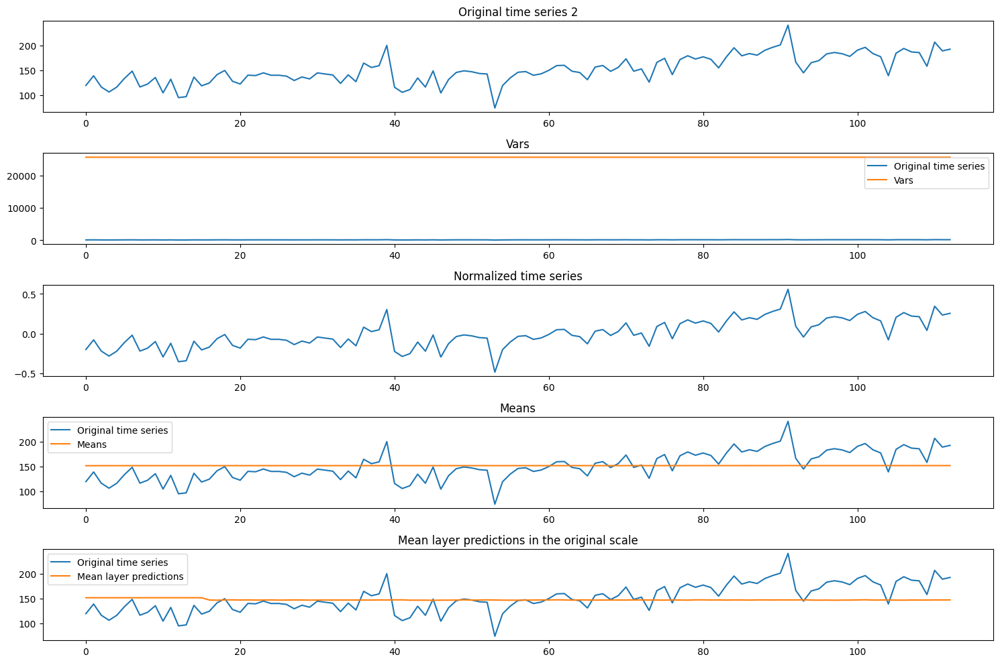

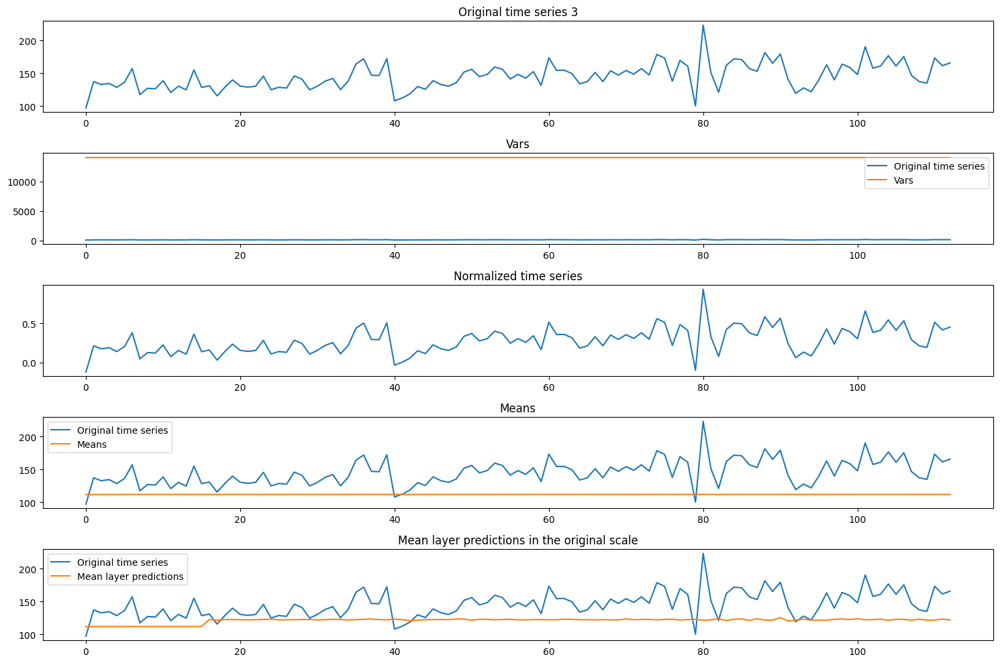

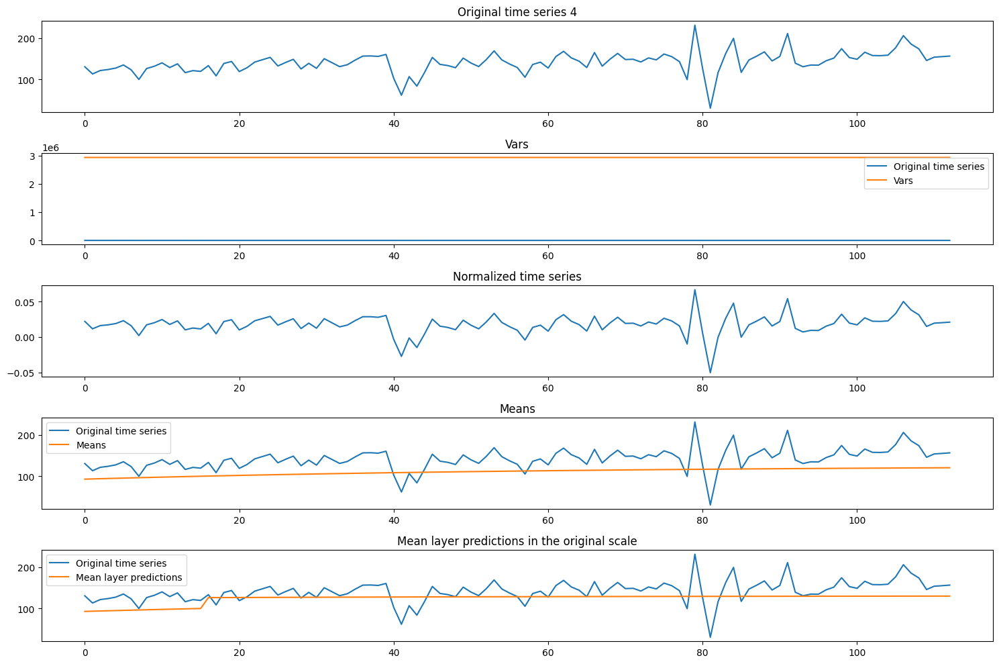

...

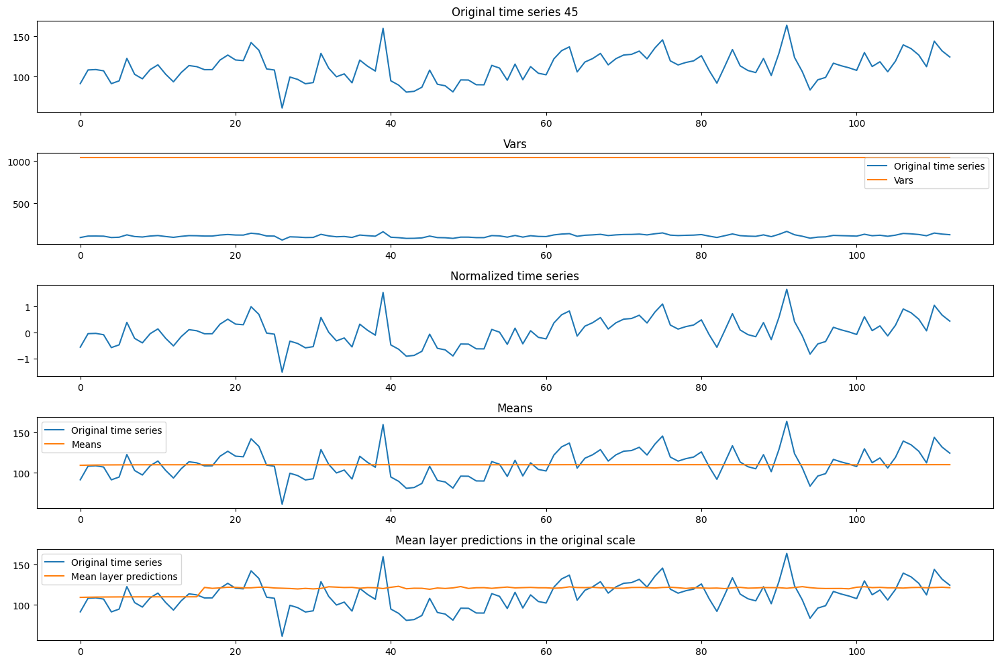

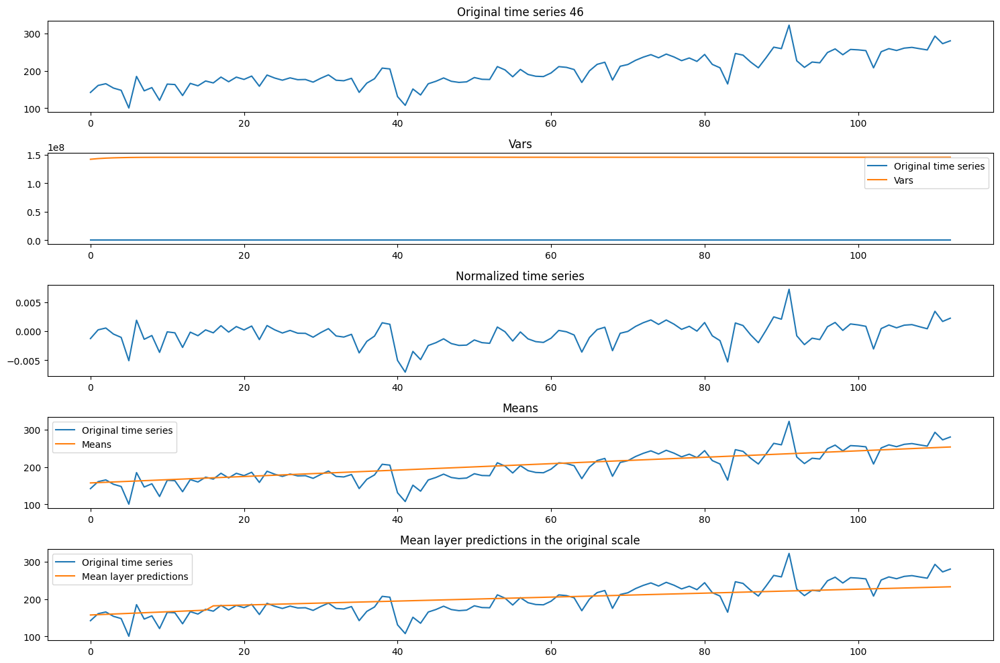

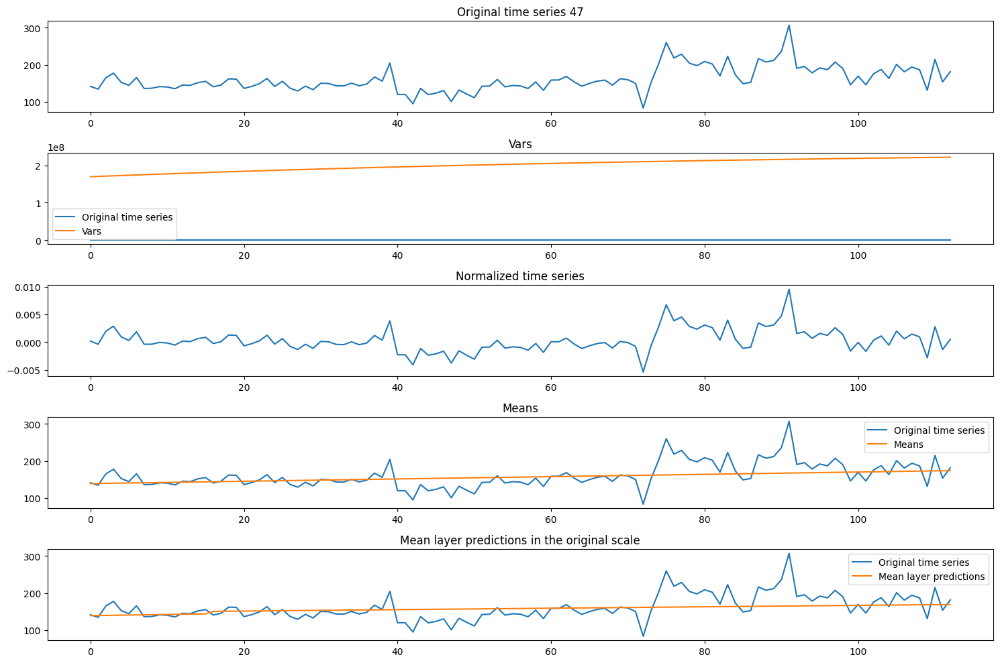

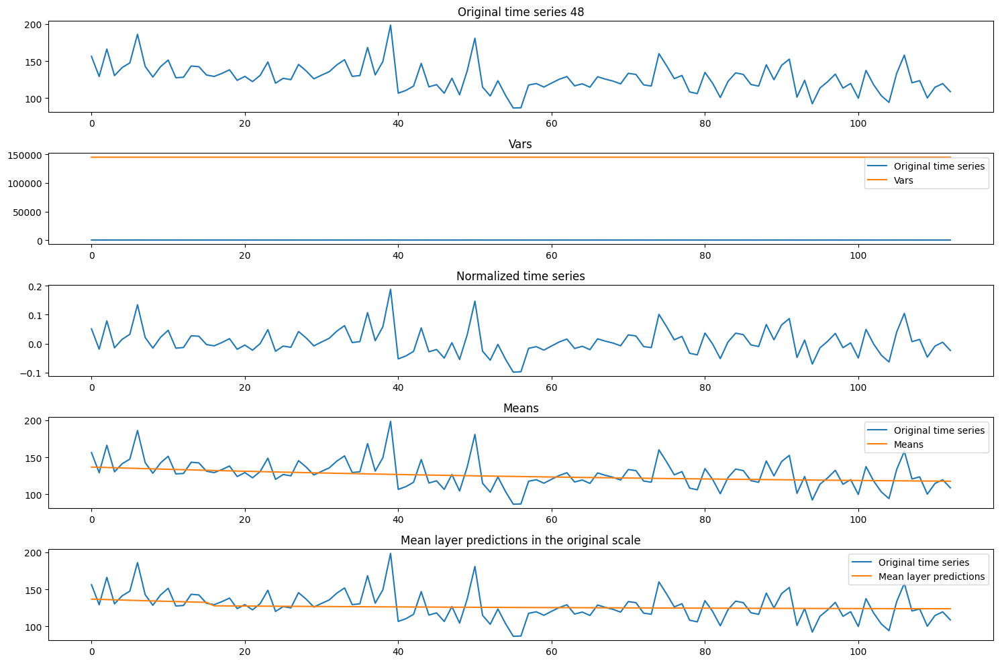

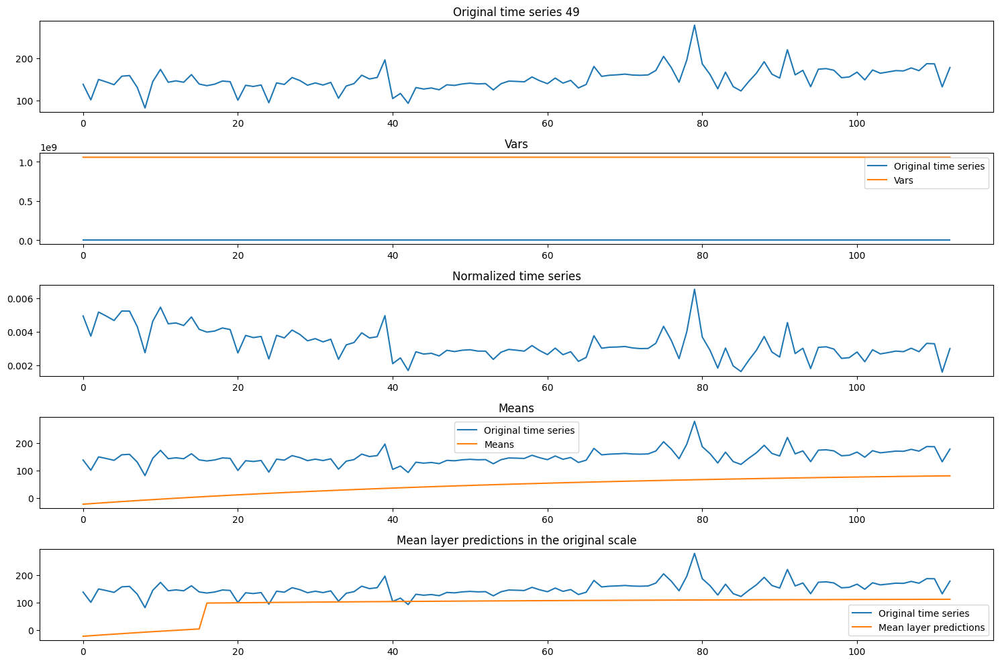

In [7]:
for ts_index in range(min(50, n_features)):

    # create a subfigure with 5 plots in each: 
    # - the original time series, 
    # - the normalized time series, 
    # - the original time series with its means,
    # - the original time series with its vars,
    # - the original time series with the predictions
    ts = test_dataset[ts_index]
    means = test_means[ts_index]
    vars = test_vars[ts_index]
    norm_ts = test_norm_ts[ts_index]
    preds = predictions[ts_index]

    fig, axs = plt.subplots(5, 1, figsize=(15, 10))
    axs[0].plot(ts)
    axs[0].set_title(f'Original time series {ts_index}')

    axs[1].plot(ts)
    axs[1].plot(vars)
    axs[1].set_title('Vars')
    axs[1].legend(['Original time series', 'Vars'])

    axs[2].plot(norm_ts)
    axs[2].set_title('Normalized time series')

    axs[3].plot(ts)
    axs[3].plot(means)
    axs[3].set_title('Means')
    axs[3].legend(['Original time series', 'Means'])

    axs[4].plot(ts)
    axs[4].plot(preds)
    axs[4].set_title('Mean layer predictions in the original scale')
    axs[4].legend(['Original time series', 'Mean layer predictions'])

    plt.tight_layout()
    plt.show()